# Generate Saliency Visualization for Novel Images

In the following notebook, we will show you how to generate the saliency visualizations on your own novel dermatopathology images. We will run this on a snippet of a WSI from the TCGA dataset which is located in the `./data/` folder.

In [4]:
import pandas as pd
import numpy as np
from pathlib import Path
import os
import sys
from collections import OrderedDict
import pickle
import yaml
from tqdm import tqdm
from PIL import Image

from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
%matplotlib inline

import torch
import torch.nn as nn

torch.manual_seed(42)
np.random.seed(42)

import zarr
import cv2

import torchvision
from torchvision.models import densenet121

from captum.attr import GuidedGradCam, IntegratedGradients, NoiseTunnel
from captum.attr import visualization as viz

from scipy.ndimage import gaussian_filter

torch.cuda.empty_cache()

## Load in Image

In [5]:
# TODO: DEFINE IMAGE PATH HERE. DEFAULT IS GIVEN PATH
# LINK TO CASE: https://portal.gdc.cancer.gov/cases/fb620e8b-4be7-4e53-af04-8e9c27b4dcf0

he_img_path = Path("./data/images/study_slides/he_snippet.jpg")
#defining an ihc image is optional, as attributions are not dependent on this; for viz purposes only
ihc_img_path = Path("./data/images/study_slides/ihc_snippet.jpg")
assert os.path.isfile(he_img_path), os.path.isfile(ihc_img_path)

In [6]:
def load_image(path2img):
    Image.MAX_IMAGE_PIXELS = None
    img = np.array(Image.open(path2img))
    return img

def select_tile(img, coords, tile_size = 1024):
    tile = img[coords[0]: coords[0]+tile_size, coords[1]: coords[1] + tile_size]
    return tile

img = load_image(he_img_path)
tile = select_tile(img, (0, 0), 256)

#optional, comment out if necessary
ihc_img = load_image(ihc_img_path)
ihc_tile = select_tile(ihc_img, (0, 0), 256)

print(img.shape, tile.shape, ihc_tile.shape)

(1024, 1024, 3) (256, 256, 3) (256, 256, 3)


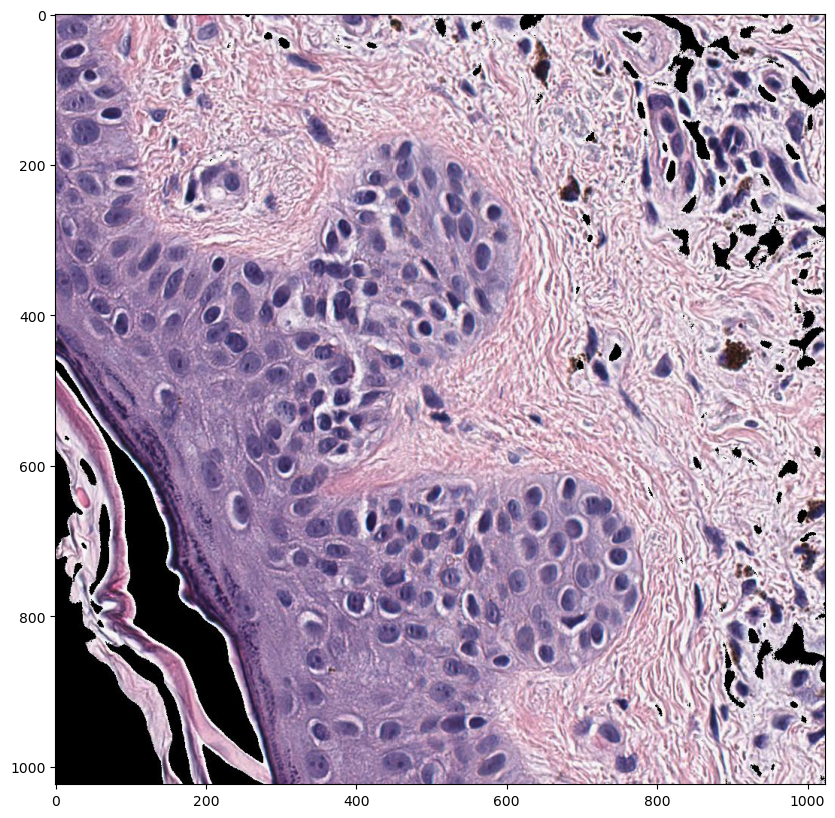

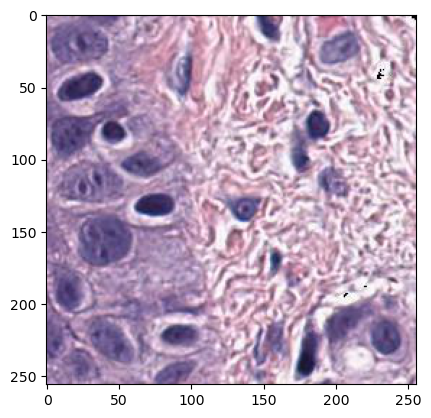

In [7]:
#visualize image to ensure proper loading
plt.figure(figsize = (10,10))
plt.imshow(img)
plt.show()
plt.imshow(tile)
plt.show()

## Instantiate Normalization Transforms

We need to normalize the input based on which model is being used for attribution.

In [8]:
norm_path = Path("./data/norms/")
mean_std_paths = {'sox10': Path(norm_path, 'sox10_mean_std.pkl'), 
                  'melanA': Path(norm_path, 'melanA_mean_std.pkl')}

def init_transforms(paths):
    all_transforms = {}
    for key, path in paths.items():
        if os.path.isfile(path):
            with open(path, "rb") as f:
                #unpickling could cause issues if versions are incorrect, may be better to rework
                (train_mean, train_std) = pickle.load(f)
        transforms = [
                    torchvision.transforms.ToTensor(), # if input is PIL Image or numpy.ndarray
                    torchvision.transforms.Normalize(mean=train_mean, std=train_std)
                    ]
        test_transforms = torchvision.transforms.Compose(transforms)
        all_transforms[key] = test_transforms
    return all_transforms

transforms = init_transforms(mean_std_paths)
transforms

{'sox10': Compose(
     ToTensor()
     Normalize(mean=tensor([0.6016, 0.4890, 0.5735]), std=tensor([0.1923, 0.1976, 0.1810]))
 ),
 'melanA': Compose(
     ToTensor()
     Normalize(mean=tensor([0.6266, 0.5071, 0.6044]), std=tensor([0.2047, 0.2049, 0.1903]))
 )}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


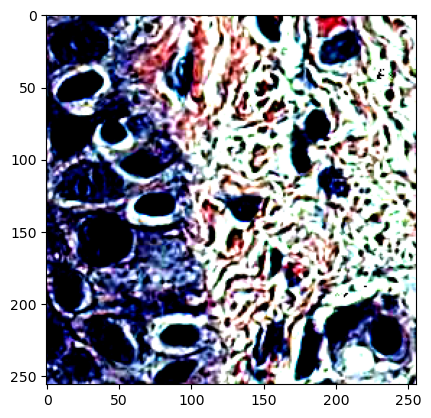

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


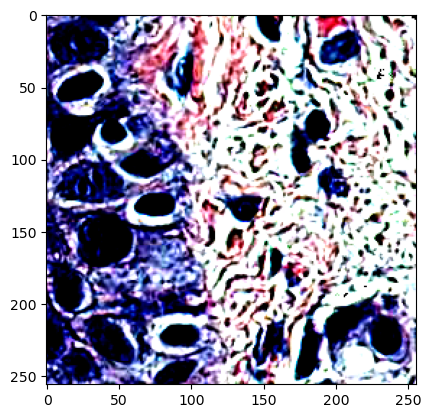

In [9]:
def transform_img(he_img, transform, display = True):
    he_img[he_img <= 10/255] = 1
    he_img = transform(he_img)
    if display:
        plt.imshow(he_img.permute(1,2,0))
        plt.show()
    return he_img.unsqueeze(0)

#need to generate two versions of the same input, normalized by the respective model's fold mean/std
print(tile.shape)
melanA_he_tile = transform_img(tile, transforms['melanA'])
sox10_he_tile = transform_img(tile, transforms['sox10'])

#these images are very similar, but slightly different
assert melanA_he_tile.sum() != sox10_he_tile.sum()

## Load in models for downstream attribution

In [10]:
def remove_module_prefix(state_dict):
    new_state_dict = OrderedDict()
    for key, value in state_dict.items():
        if key.startswith('module.'):
            new_key = key[len('module.'):]
            new_state_dict[new_key] = value
        else:
            new_state_dict[key] = value
    return new_state_dict

def initialize_model():
    model = densenet121()
    model.classifier = nn.Linear(in_features=1024, out_features=1, bias=True)
    return model

def initialize_trained_model(trained_model_path):
    saved_state = torch.load(trained_model_path)
    model = initialize_model()
    model.load_state_dict(remove_module_prefix(saved_state['state_dict']))
    return model

In [11]:
#get size of model weights (54Mb per ckpt, too big to put in repo?)

#load yaml to get different weight files
config_path = Path('../Sox10/heatmap_config.yaml')
with open(config_path, 'r') as f:
    config = yaml.load(f, Loader=yaml.SafeLoader)

#define splits from config
sox10_splitID = 5
melanA_splitID = 2

#init model using config paths to weights
melanA_model_path = config['list_model_weights'][melanA_splitID - 1]
sox10_model_path = config['list_model_weights'][sox10_splitID - 1]

#can't put both on device since they take ~90% of VRAM.
melanA_model = initialize_trained_model(melanA_model_path)
sox10_model = initialize_trained_model(sox10_model_path)

In [12]:
def prep_model(model, device):
    model = model.to(device)
    model.eval()
    return model

#TODO: if only one device is available, use one at a time
#use two devices, one for melanA and another for sox10!
DEVICE0 = "cuda:0"
DEVICE1 = "cuda:1"

melanA_model = prep_model(melanA_model, device = DEVICE0)
sox10_model = prep_model(sox10_model, device = DEVICE1)

In [13]:
#test that inference is working, difference between these two should be small
print(melanA_model(melanA_he_tile.to(DEVICE0)), melanA_model(sox10_he_tile.to(DEVICE0)))
print(sox10_model(sox10_he_tile.to(DEVICE1)))

torch.cuda.empty_cache()

tensor([[3.8457]], device='cuda:0', grad_fn=<AddmmBackward0>) tensor([[3.7939]], device='cuda:0', grad_fn=<AddmmBackward0>)
tensor([[1.5664]], device='cuda:1', grad_fn=<AddmmBackward0>)


## Define Attribution Methods

In [14]:
def generate_attr_gradcam(model, tile, device, layers = 'all'):
    named_layers = dict(model.named_modules())
    conv_layers = [layer for layer in named_layers.keys() if 'conv' in layer and 'dense' in layer]
    if layers == 'last':
        layers = ['features[-2].denselayer16.conv2']
    elif layers == 'all':
        #get all convolutional layers
        layers = conv_layers
    else:
        layers = conv_layers[layers[0]: layers[1]]
    
    #clone tile to have clean copy to work with
    try:
        tile = tile.clone().to(device)
    except:
        tile = torch.tensor(tile.copy()).to(device)
    
    #keep track of average attribution, init as 0s
    avg_output = torch.zeros(tile.shape).to(device)
    #average across all layers
    for layer in tqdm(layers):
            # print(layer)
            guided_gc = GuidedGradCam(model, eval('model.' + layer))
            noise_tunnel = NoiseTunnel(guided_gc)
            #generate 5 noisy versions of input tile, avg attribution across all and return. 1 img at a time
            attr = noise_tunnel.attribute(tile, nt_samples = 5, nt_type='smoothgrad', nt_samples_batch_size = 1)
            #sum attr to last attr
            avg_output += attr
            
    #normalize by number of layers
    avg_output /= len(layers)
    #put into image shape
    attr = np.transpose(avg_output.squeeze(0).cpu().detach().numpy(), (1,2,0))
    return attr

In [15]:
def generate_attr_ig(model, tile, device, baseline = None):
    assert baseline in ['blur', None]
    try:
        tile = tile.clone().detach().cpu().numpy()#.to(device)
    except:
        tile = torch.tensor(tile.copy()).detach().numpy()#.to(device)
    
    ig = IntegratedGradients(model)
    
    #define baselines
    blur_baseline = gaussian_filter(tile.squeeze(), sigma=(50,50,0))
    blur_baseline_t = torch.from_numpy(blur_baseline).unsqueeze(0).to(device)
    tile = torch.from_numpy(tile).to(device)
    #apply noise tunnel
    nt = NoiseTunnel(ig) 

    if baseline == 'blur':
        attr = nt.attribute(tile, baselines=blur_baseline_t, nt_samples = 5, nt_type = 'smoothgrad',
                            return_convergence_delta=False, nt_samples_batch_size = 1)
    else:
        attr = nt.attribute(tile, baselines=None, nt_samples = 5, nt_type = 'smoothgrad',
                            return_convergence_delta=False, nt_samples_batch_size = 1)
    
    attr = np.transpose(attr.squeeze(0).cpu().detach().numpy(), (1,2,0))
    
    return attr

In [16]:
#test generation of attribution via Guided GradCAM 
melanA_attr = generate_attr_gradcam(melanA_model, melanA_he_tile, DEVICE0, layers = (-5, -1))
sox10_attr = generate_attr_gradcam(sox10_model, sox10_he_tile, DEVICE1, layers = 'last')

  0%|          | 0/4 [00:00<?, ?it/s]/srv/home/sghandian/miniconda3/envs/dl_new/lib/python3.9/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(
100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


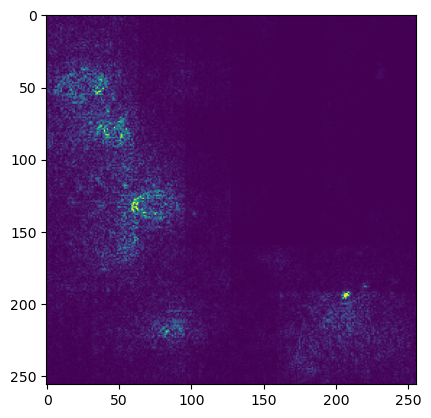

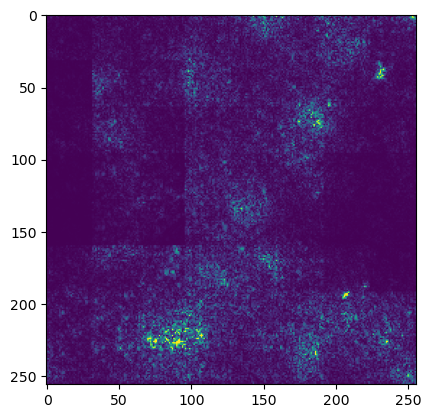

In [17]:
#visualizing these as-is will result in mostly black image as signal is very small, needs to be normalized
plt.imshow(viz._normalize_attr(melanA_attr, 'absolute_value', outlier_perc = 2.0, reduction_axis=2))
plt.show()
plt.imshow(viz._normalize_attr(sox10_attr, 'absolute_value', outlier_perc = 2.0, reduction_axis=2))

# Apply attribution to larger region and stitch

In [18]:
def get_attrs_for_large_img(img, melanA_model, sox10_model, attr_method = 'gradcam', 
                 transforms = transforms, layers = 'last', baseline = None):
    assert attr_method in ['ig', 'gradcam']
    
    melanA_attrs = []
    sox10_attrs = []
    tile_ls = []

    for ys in range(0, img.shape[1], 256):
        for xs in range(0, img.shape[0], 256):
            tile = torch.tensor(img[ys:ys+256, xs:xs+256])/ 255.0
            # print(tile.shape) #(3, 256, 256)
            tile_ls.append(tile.unsqueeze(0))
            # tile_ls.append(tile.permute(2,0,1).unsqueeze(0))
            #add transformation? i.e. normalization
            
            melanA_he_tile = transform_img(tile.numpy(), transforms['melanA'], display = False)
            sox10_he_tile = transform_img(tile.numpy(), transforms['sox10'], display = False)
            # print(melanA_he_tile.shape)
        
            if attr_method == 'gradcam':
                melanA_attr = generate_attr_gradcam(melanA_model, melanA_he_tile, DEVICE0, layers = layers)
                sox10_attr = generate_attr_gradcam(sox10_model, sox10_he_tile, DEVICE1, layers = layers)

            else:
                melanA_attr = generate_attr_ig(melanA_model, melanA_he_tile, DEVICE0, baseline = baseline)
                sox10_attr = generate_attr_ig(sox10_model, sox10_he_tile, DEVICE1, baseline = baseline)              
            
            melanA_norm = viz._normalize_attr(melanA_attr, 'absolute_value', outlier_perc = 2.0, reduction_axis=2)[np.newaxis,np.newaxis, :]
            sox10_norm = viz._normalize_attr(sox10_attr, 'absolute_value', outlier_perc = 2.0, reduction_axis=2)[np.newaxis,np.newaxis, :]
            # print(melanA_norm.shape)
            melanA_attrs.append(melanA_norm)
            sox10_attrs.append(sox10_norm)

    tile_arr = np.concatenate(np.array(tile_ls)).transpose(0, 2, 1, 3)#.transpose(0, 1, 3,2)
    # print(tile_arr.shape)
    melanA_arr = np.concatenate(np.array(melanA_attrs)).transpose(0, 2, 3, 1)
    # print(melanA_arr.shape)
    sox10_arr = np.concatenate(np.array(sox10_attrs)).transpose(0, 2, 3, 1)

    return melanA_arr, sox10_arr, tile_arr, img

#### Define attribution method here

In [19]:
#one of either integrated gradients or guided grad-cam. below images are using IG.
attr_method = 'ig'
# attr_method = 'gradcam'
melanA_arr, sox10_arr, tile_arr, reg_view =  get_attrs_for_large_img(img, melanA_model, sox10_model, 
#                                                           layers = [-10, -1]
                                                          attr_method = attr_method,
                                                          layers = 'last'
                                                         )

/tmp/ipykernel_213372/3983650972.py:35: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  tile_arr = np.concatenate(np.array(tile_ls)).transpose(0, 2, 1, 3)#.transpose(0, 1, 3,2)
/tmp/ipykernel_213372/3983650972.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  tile_arr = np.concatenate(np.array(tile_ls)).transpose(0, 2, 1, 3)#.transpose(0, 1, 3,2)


In [20]:
def stitch_batch_to_single_img(tensor, flip = False):
    # Get the number of tiles along each axis
    num_tiles, tile_height, tile_width, channels = tensor.shape
    print(tensor.shape)

    if not np.sqrt(num_tiles).is_integer():
        raise ValueError("The input tensor must have a square number of tiles.")
    sqrt_tiles = np.int32(np.sqrt(num_tiles))
    
    if tile_height != tile_width or tile_height != 256:
        raise ValueError("Each tile must be 256x256 in size.")

    # Reshape the tensor to (4, 4, 256, 256, 3)
    tensor_reshaped = tensor.reshape((sqrt_tiles, sqrt_tiles, tile_height, tile_width, channels))
    if flip:
    #flip each tile the correct direction
        tensor_reshaped = np.transpose(tensor_reshaped, (0, 1, 3, 2, 4))

    # Concatenate the tiles along the first two axes to create a 1024x1024 tile
    single_tile = np.concatenate([np.concatenate(tensor_reshaped[i], axis=1) for i in range(sqrt_tiles)], axis=0)
    
    return single_tile

complete_tile, complete_melanA_attr, complete_sox10_attr = stitch_batch_to_single_img(np.transpose(tile_arr, (0, 1, 2, 3)), flip = True), stitch_batch_to_single_img(melanA_arr), stitch_batch_to_single_img(sox10_arr)

(16, 256, 256, 3)
(16, 256, 256, 1)
(16, 256, 256, 1)


In [21]:
#apply gaussian smoothing to image
def apply_gaussian_smoothing(array, sigma):
    """
    Apply Gaussian smoothing to the input array.

    Parameters:
        array (numpy.ndarray): Input array of dimensions H x W x C.
        sigma (float or sequence of floats): Standard deviation of the Gaussian filter.

    Returns:
        numpy.ndarray: Smoothed array of the same dimensions as the input.
    """
    if not isinstance(array, np.ndarray):
        raise ValueError("Input array must be a NumPy array.")
    
    # Apply Gaussian smoothing along each channel independently
    smoothed_array = np.zeros_like(array)
    for c in range(array.shape[2]):
        smoothed_array[:, :, c] = gaussian_filter(array[:, :, c], sigma, mode='reflect')

    return smoothed_array

sigma = 1.5
smoothed_melanA_attr = apply_gaussian_smoothing(complete_melanA_attr, sigma)
smoothed_sox10_attr = apply_gaussian_smoothing(complete_sox10_attr, sigma)

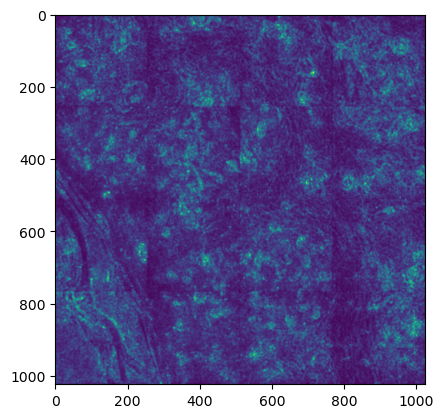

In [22]:
plt.imshow(smoothed_sox10_attr)

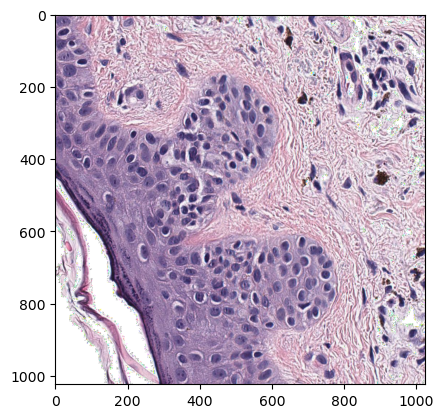

In [23]:
plt.imshow(complete_tile)

## Condition attribution map by heatmap prediction

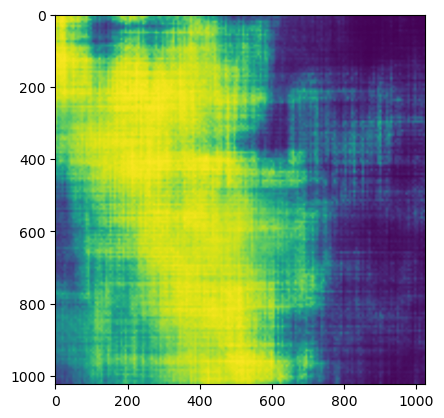

In [24]:
#load in prediction heatmap for this region, may need to resize
melanA_heatmap_path = Path('/srv/home/sghandian/dermato-paper/saliency/data/heatmaps/melanA_heatmap.npy')
# sox10_heatmap_dir = Path('/srv/ds/set-1/user/mtada/derma-heatmaps/sox10_5folds/stride_6')

#this image only has a melanA heatmap since its corresponding IHC was stained with melanA
heatmap_tile = np.load(melanA_heatmap_path)
heatmap_tile.shape
plt.imshow(heatmap_tile)

In [25]:
def condition_attr(attr, heatmap, conf_threshold = 0.9):
    attr, heatmap = attr.squeeze(), heatmap.squeeze()
    assert attr.shape == heatmap.shape
    # Threshold the second mask
    mask2_thresholded = (heatmap > conf_threshold).astype(np.uint8)

    # Perform bitwise AND operation
    result = cv2.bitwise_and(attr, attr, mask=mask2_thresholded)
    return result

## Apply grayscaling to original image based on overlap

In [26]:
#define a custom color map
threshold = 0.2
cmap_j = plt.get_cmap('plasma_r') #hot or plasma_r
# Get the colormap colors
cmap_j = cmap_j(np.arange(cmap_j.N))
# Set alpha to 0 for non values of 1
uint8_thresh = int(threshold * 256)
print(uint8_thresh)
cmap_j[:,-1][:uint8_thresh] = 0
# Create new colormap
cmap_j = ListedColormap(cmap_j)

51


In [27]:
def condition_image(image, heatmap, conf_threshold = 0.9, display_intermediates = False):
    image, heatmap = image.squeeze(), heatmap.squeeze()
    #convert image to grayscale
    gs_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    #ensure the grayscale and heatmap are the same size
    assert gs_image.shape == heatmap.shape
    
    # Threshold the heatmap to get values above it
    mask_og = (heatmap > conf_threshold).astype(np.uint8)
    #Make the grayscale images into 3 channel for np.where operation later
    mask = np.repeat(mask_og[..., np.newaxis], repeats =  3, axis = -1)
    gs_image = np.repeat(gs_image[..., np.newaxis], repeats =  3, axis = -1)
    
    if display_intermediates:
        for img in [mask_og, image, gs_image]:
            plt.figure(figsize = (10,10))
            plt.axis('off')
            plt.imshow(img)
            plt.show()
    
    #Instead of bitwise AND, we need to change the colors of the original image intersecting with mask to grayscale
    new_img = np.where(mask, image, gs_image)
    
    return new_img

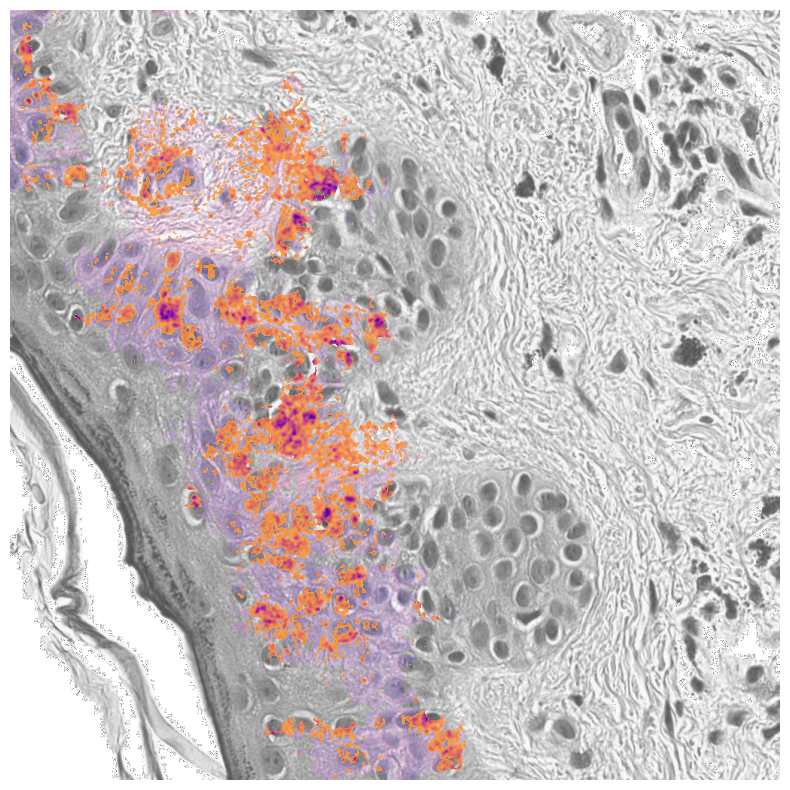

In [28]:
#display melanA attribution x melanA heatmap
thresholded_attr = condition_attr(smoothed_melanA_attr, heatmap_tile, conf_threshold = 0.9)
plt.figure(figsize = (10,10))
plt.axis('off')
plt.imshow(condition_image(complete_tile, heatmap_tile, conf_threshold = 0.9), alpha = 0.75)
plt.imshow(thresholded_attr, cmap = cmap_j, alpha = 0.90)

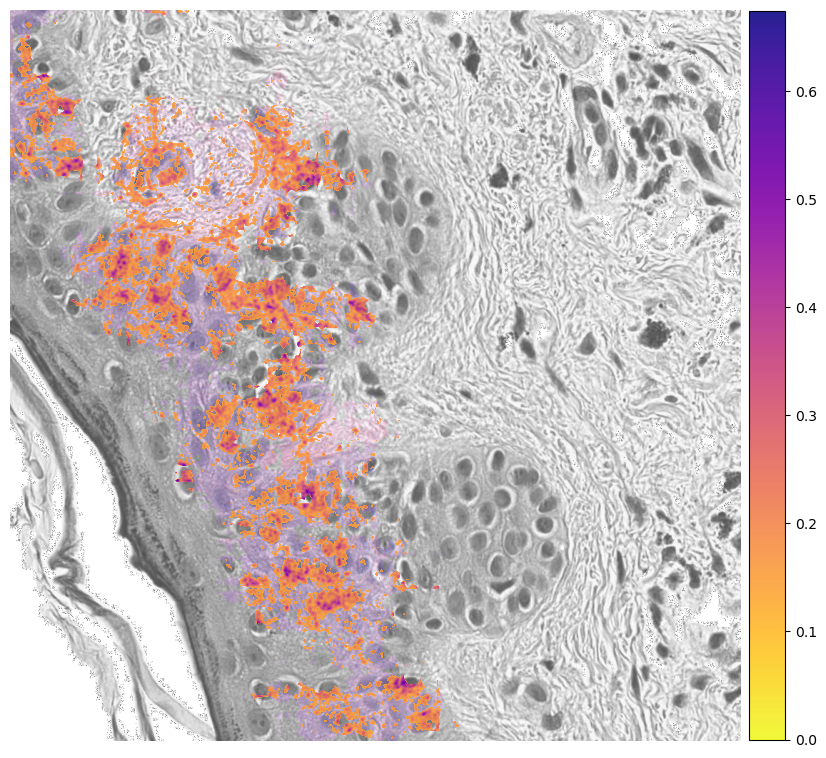

In [29]:
#display sox10 attribution x melanA heatmap
thresholded_attr = condition_attr(smoothed_sox10_attr, heatmap_tile, conf_threshold = 0.9)
plt.figure(figsize = (10,10))
plt.axis('off')
plt.imshow(condition_image(complete_tile, heatmap_tile, conf_threshold = 0.9), alpha = 0.75)
plt.imshow(thresholded_attr, cmap = cmap_j, alpha = 0.9)
plt.colorbar(fraction = 0.047, pad = 0.01)

## Multiplex Agreement Map

In [30]:
#define the thresholded attrs using heatmap confidence (same as above)
cond_melanA_attr = condition_attr(smoothed_melanA_attr, heatmap_tile, conf_threshold = 0.9)
cond_sox10_attr = condition_attr(smoothed_sox10_attr, heatmap_tile, conf_threshold = 0.9)

In [31]:
def cm_indices(prediction, ground_truth, conf_threshold=0.2): #pred and ground_truth take on a value of 0 or 1     
    pred_prob = (prediction > threshold).astype(float)
    ground_truth = (ground_truth > threshold).astype(float)
    pos_pred = pred_prob*2 
    agreement = pos_pred + ground_truth # 3 for TP, 2 for FP, 1 for FN, 0 for TN

    epsilon = 1e-6

    tp_indices = np.array(list(zip(*np.where(agreement==3)))) #+ epsilon
    tn_indices = np.array(list(zip(*np.where(agreement==0)))) #+ epsilon
    fp_indices = np.array(list(zip(*np.where(agreement==2)))) #+ epsilon
    fn_indices = np.array(list(zip(*np.where(agreement==1)))) #+ epsilon
    
    return tp_indices, tn_indices, fp_indices, fn_indices

In [51]:
#after bianrizing all inputs, we construct an agreement map
def construct_agreement_map(melanA_attr, sox10_attr, img, heatmap_img, conf_threshold = 0.5, attr_threshold = 0.2):
    assert melanA_attr.shape == sox10_attr.shape == img.shape[:2] == heatmap_img.shape[:2]
    #condition the attributions to be in only the region where heatmap prob > threshold
    melanA_attr = condition_attr(melanA_attr, heatmap_tile, conf_threshold = conf_threshold)
    sox10_attr = condition_attr(sox10_attr, heatmap_tile, conf_threshold = conf_threshold)
    # grayscale the non-relevant portion of the image
    img = condition_image(img, heatmap_tile, conf_threshold = conf_threshold) 

    #find the indices that are TP (agreement), FP (melanA), FN (sox10) or TN (neither)
    tp_indices, tn_indices, fp_indices, fn_indices = cm_indices(melanA_attr, sox10_attr, conf_threshold = attr_threshold)
    tp_label, tn_label, fp_label, fn_label = (np.zeros(melanA_attr.shape), np.zeros(melanA_attr.shape),
                                              np.zeros(melanA_attr.shape), np.zeros(melanA_attr.shape))

    if len(tp_indices)!=0:
        tp_label[tp_indices[:,0], tp_indices[:,1]] = 1
    if len(tn_indices) !=0:
        tn_label[tn_indices[:,0], tn_indices[:,1]] = 1
    if len(fp_indices) != 0:
        fp_label[fp_indices[:,0], fp_indices[:,1]] = 1
    if len(fn_indices) != 0:
        fn_label[fn_indices[:,0], fn_indices[:,1]] = 1

    # #dilating masks
    # kernel = np.ones((3,3), np.uint8)
    # tp_label = cv2.dilate(src = tp_label, kernel = kernel)
    # fp_label = cv2.dilate(src = fp_label, kernel = kernel)
    # tn_label = cv2.dilate(src = tn_label, kernel = kernel)
    # fn_label = cv2.dilate(src = fn_label, kernel = kernel)

    #defining color maps
    colors_TP = [(0, (0, 0, 0, 0)),(0.5, (0.5, 0.5, 0.5, 0.3)), (1.0, (0, 0, 1.0, 0.6))] #dark blue
    # colors_FP = [(0, (0, 0, 0, 0)),(0.5, (0.5, 0.5, 0.5, 0.3)), (1.0, (0.9, 0.4, 0, 0.8))] #orange
    
    colors_FP = [(0, (0, 0, 0, 0)), (0.5, (0.5, 0.5, 0.5, 0.3)), (1.0, (0.5, 1.0, 0, 1.0))]  # neon green
    colors_FN = [(0, (0, 0, 0, 0)), (0.5, (0.5, 1.0, 0, 0.3)), (1.0, (1, 0.1, 0, 0.6))] #red
    colors_TN = [(0, (0, 0, 0, 0)), (0.5, (0.5, 0, 0, 0.0)), (1.0, (0, 0.3, 0.3, 0.2))] # light blue          
    
    cmap_TP = LinearSegmentedColormap.from_list("custom", colors_TP, N=256)
    cmap_FP = LinearSegmentedColormap.from_list("custom", colors_FP, N=256)
    cmap_FN = LinearSegmentedColormap.from_list("custom", colors_FN, N=256)
    cmap_TN = ListedColormap(np.array([173, 216, 240])/255)

    fig, ax = plt.subplots(figsize=(20,20))

    roi = ax.imshow(img, alpha = 0.75) # raw input image


    #roi_tn = ax.imshow(tn_roi_label, cmap=cmap_TN, alpha=0.35) # true negative region/label
    roi_fn = ax.imshow(fn_label, cmap=cmap_FN) #false negative region/label
    roi_fp = ax.imshow(fp_label, cmap = cmap_FP) # false positive region/label
    roi_tp = ax.imshow(tp_label, cmap=cmap_TP) #true positive region/label


    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='blue', lw=4),
                    Line2D([0], [0], color='lime', lw=4),
                    Line2D([0], [0], color='red', lw=4),
                    Line2D([0], [0], color='lightsteelblue', lw=4)]


    ax.legend(custom_lines, ['Agreement', 'MelanA', 'Sox10'], bbox_to_anchor=(1, 1), borderpad=1, fontsize=30)
    
    plt.axis('off')
    plt.show()
    return roi

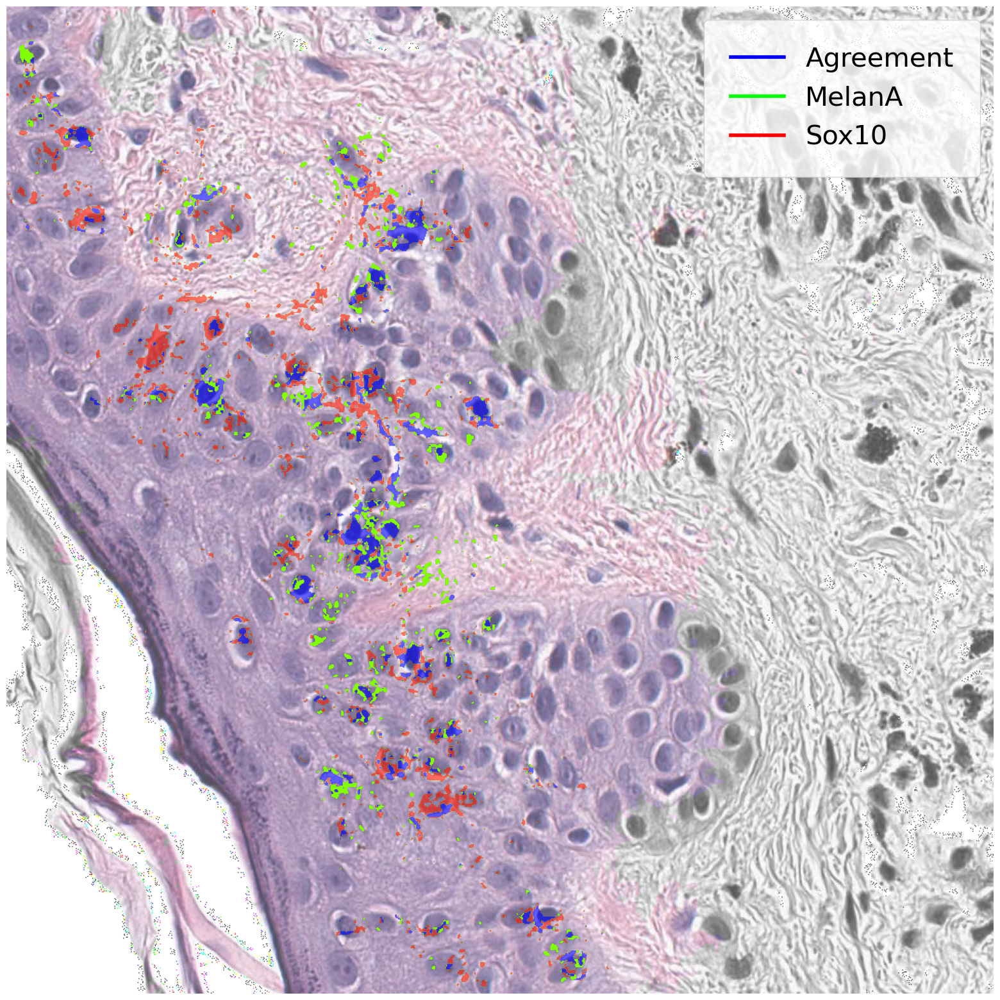

In [52]:
construct_agreement_map(cond_melanA_attr, cond_sox10_attr, complete_tile, heatmap_tile);